# STUDENT NAME : SHIVAANI KATRAGADDA
# STUDENT NUMBER : R00183214

In [1]:
#loading all the required packages
import os
import glob
import numpy as np
import pandas as pd
import string
from string import punctuation
import re
import csv
import nltk
from nltk.corpus import wordnet as wn
import string
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import wordcloud
import itertools
from nltk.stem import PorterStemmer, WordNetLemmatizer
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn import metrics
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import  accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import MultinomialNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score
import pickle


# HAM EMAILS

In [2]:
#Reading all the ham emails and storing it in the variable ham_path
ham="F:/semester2/AML/ham"
ham_path=glob.glob(os.path.join(ham,"*.txt"))
print(ham_path)

['F:/semester2/AML/ham\\0001.1999-12-10.farmer.ham.txt', 'F:/semester2/AML/ham\\0002.1999-12-13.farmer.ham.txt', 'F:/semester2/AML/ham\\0003.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0004.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0005.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0007.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0009.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0010.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0011.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0012.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0013.1999-12-14.farmer.ham.txt', 'F:/semester2/AML/ham\\0014.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0015.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0016.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0019.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0020.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0021.1999-12-15.farmer.ham.txt', 'F:/semester2/AML/ham\\0022.1999-12-16.farmer.h

In [3]:
#Reading allthe ham files and appending in to a list "files"
files=[]
for i in ham_path:
    with open(i,encoding='latin-1')as p:
        k=p.read()
        files.append(k)
#files

In [4]:
#Cleaning the ham files by removing the regular expressions for the ham emails
clean_data = []

for x in (files): 
    ham = re.sub('<.*?>', '', x)
    ham = re.sub(r'[^\w\s]', '', ham)
    ham = re.sub('[^A-Za-z0-9]+',' ' ,ham)   # remove HTML tags
    ham = re.sub("Subject ", " ",ham)
    ham = re.sub(r'http\S+', ' ', ham)
    ham = re.sub("\d+", " ", ham)
    ham = re.sub("Subject ", " ", ham)
    ham = re.sub(" ", " ", ham)
    ham = ham.replace('\n', ' ')
    ham = ham.translate(str.maketrans("", "", punctuation))
    ham = ham.lower()
    ham = ham.strip()
    
    if ham != '':
        clean_data.append(ham)
clean_data

['christmas tree farm pictures',
 'vastar resources inc gary production from the high island larger block a     commenced on saturday at     p m at about     gross carlos expects between     and     gross for tomorrow vastar owns   of the gross production george x     forwarded by george weissman hou ect on           am daren j farmer           am to carlos j rodriguez hou ect ect cc george weissman hou ect ect melissa graves hou ect ect subject vastar resources inc carlos please call linda and get everything set up i m going to estimate     coming up tomorrow with a     increase each following day based on my conversations with bill fischer at bmar d forwarded by daren j farmer hou ect on           am enron north america corp from george weissman           am to daren j farmer hou ect ect cc gary bryan hou ect ect melissa graves hou ect ect subject vastar resources inc darren the attached appears to be a nomination from vastar resources inc for the high island larger block a     previ

In [5]:
#Now I am trying to filter the list by splitting the list and checking if the word is a stop word or not,if the word is not a stop word Then I am storing in the list

filter_outer_list=[]
filter_inner_list=[]
for sentence in clean_data:
    filter_inner_list=[word for word in sentence.split() if word not in stopwords.words("english")]
    filter_outer_list.append(filter_inner_list)
filter_outer_list

[['christmas', 'tree', 'farm', 'pictures'],
 ['vastar',
  'resources',
  'inc',
  'gary',
  'production',
  'high',
  'island',
  'larger',
  'block',
  'commenced',
  'saturday',
  'p',
  'gross',
  'carlos',
  'expects',
  'gross',
  'tomorrow',
  'vastar',
  'owns',
  'gross',
  'production',
  'george',
  'x',
  'forwarded',
  'george',
  'weissman',
  'hou',
  'ect',
  'daren',
  'j',
  'farmer',
  'carlos',
  'j',
  'rodriguez',
  'hou',
  'ect',
  'ect',
  'cc',
  'george',
  'weissman',
  'hou',
  'ect',
  'ect',
  'melissa',
  'graves',
  'hou',
  'ect',
  'ect',
  'subject',
  'vastar',
  'resources',
  'inc',
  'carlos',
  'please',
  'call',
  'linda',
  'get',
  'everything',
  'set',
  'going',
  'estimate',
  'coming',
  'tomorrow',
  'increase',
  'following',
  'day',
  'based',
  'conversations',
  'bill',
  'fischer',
  'bmar',
  'forwarded',
  'daren',
  'j',
  'farmer',
  'hou',
  'ect',
  'enron',
  'north',
  'america',
  'corp',
  'george',
  'weissman',
  'dare

In [6]:
#The data is stored in the list outer list in the form of list(inner list).so i am trying to remove the inner list and store all the data in a single list

flattened =[[' '.join(i)] for i in filter_outer_list ]
flattened


[['christmas tree farm pictures'],
 ['vastar resources inc gary production high island larger block commenced saturday p gross carlos expects gross tomorrow vastar owns gross production george x forwarded george weissman hou ect daren j farmer carlos j rodriguez hou ect ect cc george weissman hou ect ect melissa graves hou ect ect subject vastar resources inc carlos please call linda get everything set going estimate coming tomorrow increase following day based conversations bill fischer bmar forwarded daren j farmer hou ect enron north america corp george weissman daren j farmer hou ect ect cc gary bryan hou ect ect melissa graves hou ect ect subject vastar resources inc darren attached appears nomination vastar resources inc high island larger block previously erroneously referred well vastar expects well commence production sometime tomorrow told linda harris get telephone number gas control provide notification turn tomorrow linda numbers record voice fax would please see someone c

In [7]:
flattened1 = [val for sublist in flattened for val in sublist]
flattened1

['christmas tree farm pictures',
 'vastar resources inc gary production high island larger block commenced saturday p gross carlos expects gross tomorrow vastar owns gross production george x forwarded george weissman hou ect daren j farmer carlos j rodriguez hou ect ect cc george weissman hou ect ect melissa graves hou ect ect subject vastar resources inc carlos please call linda get everything set going estimate coming tomorrow increase following day based conversations bill fischer bmar forwarded daren j farmer hou ect enron north america corp george weissman daren j farmer hou ect ect cc gary bryan hou ect ect melissa graves hou ect ect subject vastar resources inc darren attached appears nomination vastar resources inc high island larger block previously erroneously referred well vastar expects well commence production sometime tomorrow told linda harris get telephone number gas control provide notification turn tomorrow linda numbers record voice fax would please see someone cont

In [8]:

#After that I am storing the whole list in to a dataframe by using pandas and named that frame as ham 
#For ham I have assigned target as "ham"
ham = pd.DataFrame({'emails':flattened1})
ham['target']="ham"
ham

,emails,target
0,christmas tree farm pictures,ham
1,vastar resources inc gary production high isla...,ham
2,calpine daily gas nomination calpine daily gas...,ham
3,issue fyi see note already done stella forward...,ham
4,meter nov allocation fyi forwarded lauri allen...,ham
...,...,...
3667,tenaska iv call thursday good time original me...,ham
3668,generic contract hi daren sorry delay blank co...,ham
3669,contracts credit thanks include master file or...,ham
3670,tenaska iv ok since appear able hook phone res...,ham


In [9]:
#Displaying the first five emails of the ham emails
ham.head()

,emails,target
0,christmas tree farm pictures,ham
1,vastar resources inc gary production high isla...,ham
2,calpine daily gas nomination calpine daily gas...,ham
3,issue fyi see note already done stella forward...,ham
4,meter nov allocation fyi forwarded lauri allen...,ham


In [10]:
#The names of the columns of the ham emails
ham.columns

Index(['emails', 'target'], dtype='object')

In [11]:
#The shape of the ham emails,i.e the number of rows and columns 
ham.shape

(3672, 2)

In [12]:
#checking if there are any null or missing  values are present
ham.isnull().any()

emails    False
target    False
dtype: bool

In [13]:
#The describe() function computes a summary of statistics pertaining to the DataFrame columns
ham.describe()

,emails,target
count,3672,3672
unique,3174,1
top,hpl nom march see attached file hplno xls hpln...,ham
freq,31,3672


In [14]:
#The describe() function computes a summary of statistics pertaining to the DataFrame columns
#Now I grouped by target to know the stastics of target column
ham.groupby('target').describe()

emails                                                               
        count unique                                                top freq
target                                                                      
ham      3672   3174  hpl nom march see attached file hplno xls hpln...   31

# SPAM EMAILS

In [15]:
#Reading all the ham emails and storing it in the variable spam_path

spam="F:/semester2/AML/spam"
spam_path=glob.glob(os.path.join(spam,"*.txt"))
print(spam_path)

['F:/semester2/AML/spam\\0006.2003-12-18.GP.spam.txt', 'F:/semester2/AML/spam\\0008.2003-12-18.GP.spam.txt', 'F:/semester2/AML/spam\\0017.2003-12-18.GP.spam.txt', 'F:/semester2/AML/spam\\0018.2003-12-18.GP.spam.txt', 'F:/semester2/AML/spam\\0026.2003-12-18.GP.spam.txt', 'F:/semester2/AML/spam\\0032.2003-12-19.GP.spam.txt', 'F:/semester2/AML/spam\\0040.2003-12-19.GP.spam.txt', 'F:/semester2/AML/spam\\0041.2003-12-19.GP.spam.txt', 'F:/semester2/AML/spam\\0046.2003-12-20.GP.spam.txt', 'F:/semester2/AML/spam\\0052.2003-12-20.GP.spam.txt', 'F:/semester2/AML/spam\\0054.2003-12-21.GP.spam.txt', 'F:/semester2/AML/spam\\0058.2003-12-21.GP.spam.txt', 'F:/semester2/AML/spam\\0061.2003-12-21.GP.spam.txt', 'F:/semester2/AML/spam\\0062.2003-12-22.GP.spam.txt', 'F:/semester2/AML/spam\\0065.2003-12-23.GP.spam.txt', 'F:/semester2/AML/spam\\0069.2003-12-23.GP.spam.txt', 'F:/semester2/AML/spam\\0072.2003-12-24.GP.spam.txt', 'F:/semester2/AML/spam\\0073.2003-12-24.GP.spam.txt', 'F:/semester2/AML/spam\\007

In [16]:
#Reading allthe spam files and appending in to a list "files1"
files1=[]
for i in spam_path:
    with open(i,encoding='latin-1')as p:
        k=p.read()
        files1.append(k)
files1

['Subject: dobmeos with hgh my energy level has gone up ! stukm\nintroducing\ndoctor - formulated\nhgh\nhuman growth hormone - also called hgh\nis referred to in medical science as the master hormone . it is very plentiful\nwhen we are young , but near the age of twenty - one our bodies begin to produce\nless of it . by the time we are forty nearly everyone is deficient in hgh ,\nand at eighty our production has normally diminished at least 90 - 95 % .\nadvantages of hgh :\n- increased muscle strength\n- loss in body fat\n- increased bone density\n- lower blood pressure\n- quickens wound healing\n- reduces cellulite\n- improved vision\n- wrinkle disappearance\n- increased skin thickness texture\n- increased energy levels\n- improved sleep and emotional stability\n- improved memory and mental alertness\n- increased sexual potency\n- resistance to common illness\n- strengthened heart muscle\n- controlled cholesterol\n- controlled mood swings\n- new hair growth and color restore\nread\nmo

In [17]:
#Cleaning the ham files by removing the regular expressions for the spam emails
clean_data1 = []

for x in (files1): 
    spam = re.sub('<.*?>', '', x)
    #new_text = re.sub(r'[^\w\s]', '', new_text)
    
    spam = re.sub('[^A-Za-z0-9]+',' ' ,spam)
    # remove HTML tags
    spam = re.sub(r'http\S+', ' ', spam)
    spam = re.sub("\d+", " ", spam)
    spam = re.sub("Subject ", " ", spam)
    spam = re.sub(" ", " ", spam)
    spam = spam.replace('\n', ' ')
    spam = spam.translate(str.maketrans("", "", punctuation))
    spam = spam.lower()
    spam = spam.strip()
             
    if spam != '':
        clean_data1.append(spam)
clean_data1

['dobmeos with hgh my energy level has gone up stukm introducing doctor formulated hgh human growth hormone also called hgh is referred to in medical science as the master hormone it is very plentiful when we are young but near the age of twenty one our bodies begin to produce less of it by the time we are forty nearly everyone is deficient in hgh and at eighty our production has normally diminished at least     advantages of hgh increased muscle strength loss in body fat increased bone density lower blood pressure quickens wound healing reduces cellulite improved vision wrinkle disappearance increased skin thickness texture increased energy levels improved sleep and emotional stability improved memory and mental alertness increased sexual potency resistance to common illness strengthened heart muscle controlled cholesterol controlled mood swings new hair growth and color restore read more at this website unsubscribe',
 'your prescription is ready oxwq s f e low cost prescription medic

In [18]:
#Now I am trying to filter the list by splitting the list and checking if the word is a stop word or not,if the word is not a stop word Then I am storing in the list

filter_outer_list1=[]
filter_inner_list1=[]
for sentence in clean_data1:
    filter_inner_list1=[word for word in sentence.split() if word not in stopwords.words("english")]
    filter_outer_list1.append(filter_inner_list1)
filter_outer_list1

[['dobmeos',
  'hgh',
  'energy',
  'level',
  'gone',
  'stukm',
  'introducing',
  'doctor',
  'formulated',
  'hgh',
  'human',
  'growth',
  'hormone',
  'also',
  'called',
  'hgh',
  'referred',
  'medical',
  'science',
  'master',
  'hormone',
  'plentiful',
  'young',
  'near',
  'age',
  'twenty',
  'one',
  'bodies',
  'begin',
  'produce',
  'less',
  'time',
  'forty',
  'nearly',
  'everyone',
  'deficient',
  'hgh',
  'eighty',
  'production',
  'normally',
  'diminished',
  'least',
  'advantages',
  'hgh',
  'increased',
  'muscle',
  'strength',
  'loss',
  'body',
  'fat',
  'increased',
  'bone',
  'density',
  'lower',
  'blood',
  'pressure',
  'quickens',
  'wound',
  'healing',
  'reduces',
  'cellulite',
  'improved',
  'vision',
  'wrinkle',
  'disappearance',
  'increased',
  'skin',
  'thickness',
  'texture',
  'increased',
  'energy',
  'levels',
  'improved',
  'sleep',
  'emotional',
  'stability',
  'improved',
  'memory',
  'mental',
  'alertness',
  '

In [19]:
#The data is stored in the list outer list in the form of list(inner list).so i am trying to remove the inner list and store all the data in a single list

flattened2 =[[' '.join(i)] for i in filter_outer_list1 ]
flattened2

[['dobmeos hgh energy level gone stukm introducing doctor formulated hgh human growth hormone also called hgh referred medical science master hormone plentiful young near age twenty one bodies begin produce less time forty nearly everyone deficient hgh eighty production normally diminished least advantages hgh increased muscle strength loss body fat increased bone density lower blood pressure quickens wound healing reduces cellulite improved vision wrinkle disappearance increased skin thickness texture increased energy levels improved sleep emotional stability improved memory mental alertness increased sexual potency resistance common illness strengthened heart muscle controlled cholesterol controlled mood swings new hair growth color restore read website unsubscribe'],
 ['prescription ready oxwq f e low cost prescription medications soma ultram adipex vicodin many prescribed online shipped overnight door one us licensed physicians write fda approved prescription ship order overnight v

In [20]:

flattened3 = [val for sublist in flattened2 for val in sublist]
flattened3

['dobmeos hgh energy level gone stukm introducing doctor formulated hgh human growth hormone also called hgh referred medical science master hormone plentiful young near age twenty one bodies begin produce less time forty nearly everyone deficient hgh eighty production normally diminished least advantages hgh increased muscle strength loss body fat increased bone density lower blood pressure quickens wound healing reduces cellulite improved vision wrinkle disappearance increased skin thickness texture increased energy levels improved sleep emotional stability improved memory mental alertness increased sexual potency resistance common illness strengthened heart muscle controlled cholesterol controlled mood swings new hair growth color restore read website unsubscribe',
 'prescription ready oxwq f e low cost prescription medications soma ultram adipex vicodin many prescribed online shipped overnight door one us licensed physicians write fda approved prescription ship order overnight via 

In [21]:
#After that I am storing the whole list in to a dataframe by using pandas and named that frame as spam 
#For spam I have assigned target as "spam"
spam = pd.DataFrame({'emails':flattened3})

spam['target']="spam"
spam

,emails,target
0,dobmeos hgh energy level gone stukm introducin...,spam
1,prescription ready oxwq f e low cost prescript...,spam
2,get new car people nowthe weather climate part...,spam
3,await response dear partner team government of...,spam
4,coca cola mbna america nascar partner otcbb im...,spam
...,...,...
1477,pro forma invoice attached divide cover gave t...,spam
1478,str rndlen extra time word bodyhtml,spam
1479,check bb hey derm bbbbb check paris many celeb...,spam
1480,hot jobs global marketing specialties po box e...,spam


In [22]:
#Displaying the first five emails of the spam emails
spam.head()

,emails,target
0,dobmeos hgh energy level gone stukm introducin...,spam
1,prescription ready oxwq f e low cost prescript...,spam
2,get new car people nowthe weather climate part...,spam
3,await response dear partner team government of...,spam
4,coca cola mbna america nascar partner otcbb im...,spam


In [23]:
#The names of the columns of the spam emails

spam.columns

Index(['emails', 'target'], dtype='object')

In [24]:
#The shape of the spam emails,i.e the number of rows and columns 
spam.shape

(1482, 2)

In [25]:
#checking if there are any null or missing  values are present
spam.isnull().any()

emails    False
target    False
dtype: bool

In [26]:
#The describe() function computes a summary of statistics pertaining to the DataFrame columns
spam.describe()

,emails,target
count,1482,1482
unique,1457,1
top,found school,spam
freq,3,1482


In [27]:
#The describe() function computes a summary of statistics pertaining to the DataFrame columns
#Now I grouped by target to know the stastics of target column
spam.groupby('target').describe()

emails                          
        count unique           top freq
target                                 
spam     1482   1457  found school    3

# combining both ham and spam emails

In [28]:
#combining both the ham and spam emails by using pandas dataframe and storing in the variable email
email=pd.concat([ham,spam,])


In [29]:
#Displaying the first five emails of the email
email.head()

,emails,target
0,christmas tree farm pictures,ham
1,vastar resources inc gary production high isla...,ham
2,calpine daily gas nomination calpine daily gas...,ham
3,issue fyi see note already done stella forward...,ham
4,meter nov allocation fyi forwarded lauri allen...,ham


In [30]:
#The names of the columns of the  email
email.shape

(5154, 2)

In [31]:
#checking if there are any null or missing  values are present
email.isnull().any()

emails    False
target    False
dtype: bool

In [32]:
#dropping all the duplicates
email=email.drop_duplicates(subset=None, keep='first', inplace=False)


In [33]:
#checking the shape of the email
email.shape

(4631, 2)

In [34]:
#the stastics of the email
email.describe()

,emails,target
count,4631,4631
unique,4631,2
top,rangel dewpoint please see attached memo meter...,ham
freq,1,3174


In [35]:
#the stastics of the target column of the email
email.groupby('target').describe()

emails                                                               
        count unique                                                top freq
target                                                                      
ham      3174   3174  rangel dewpoint please see attached memo meter...    1
spam     1457   1457  smallcap cribsheet investor alert immediate re...    1

### some EDA on email

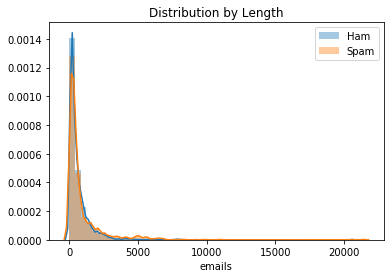

In [36]:
# plotting graph by length.

ham =email[email['target'] == 'ham']['emails'].str.len()
sns.distplot(ham, label='Ham')
spam = email[email['target'] == 'spam']['emails'].str.len()
sns.distplot(spam, label='Spam')
plt.title('Distribution by Length')
plt.legend()

C:\Users\DELL\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\DELL\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\DELL\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:487: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\DELL\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2


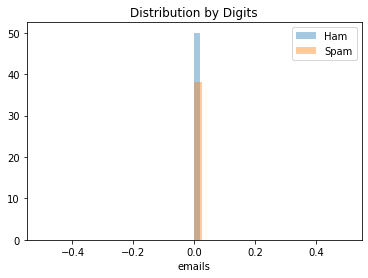

In [37]:
#plotting graph by digits.

ham1 = email[email['target'] == 'ham']['emails'].str.replace(r'\D+', '').str.len()
sns.distplot(ham1, label='Ham')
spam1 = email[email['target'] == 'spam']['emails'].str.replace(r'\D+', '').str.len()
sns.distplot(spam1, label='Spam')
plt.title('Distribution by Digits')
plt.legend()

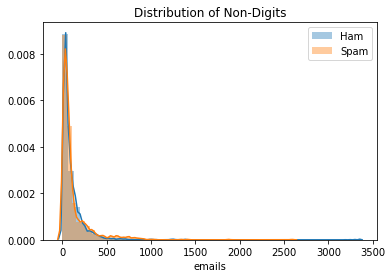

In [38]:
#plotting graph for non-digits.

ham2 = email[email['target'] == 'ham']['emails'].str.replace(r'\w+', '').str.len()
sns.distplot(ham2, label='Ham')
spam2 = email[email['target'] == 'spam']['emails'].str.replace(r'\w+', '').str.len()
sns.distplot(spam2, label='Spam')
plt.title('Distribution of Non-Digits')
plt.legend()

In [39]:
#Assigning label for ham:0 and spam:1
email['label'] = email['target'].map( {'spam': 1, 'ham': 0} ).astype(int)
email.head(15)

,emails,target,label
0,christmas tree farm pictures,ham,0
1,vastar resources inc gary production high isla...,ham,0
2,calpine daily gas nomination calpine daily gas...,ham,0
3,issue fyi see note already done stella forward...,ham,0
4,meter nov allocation fyi forwarded lauri allen...,ham,0
5,mcmullen gas jackie since inlet river plant sh...,ham,0
6,meter jan george need following done jan zero ...,ham,0
7,duns number changes fyi forwarded gary l payne...,ham,0
8,king ranch two fields gas difficulty unify sys...,ham,0
9,entex transistion thanks much memo would like ...,ham,0


In [40]:
#finding the text length of each email
email['length'] = email['emails'].apply(len)
email

,emails,target,label,length
0,christmas tree farm pictures,ham,0,28
1,vastar resources inc gary production high isla...,ham,0,1265
2,calpine daily gas nomination calpine daily gas...,ham,0,61
3,issue fyi see note already done stella forward...,ham,0,596
4,meter nov allocation fyi forwarded lauri allen...,ham,0,590
...,...,...,...,...
1477,pro forma invoice attached divide cover gave t...,spam,1,411
1478,str rndlen extra time word bodyhtml,spam,1,35
1479,check bb hey derm bbbbb check paris many celeb...,spam,1,50
1480,hot jobs global marketing specialties po box e...,spam,1,102


AttributeError: module 'matplotlib.pyplot' has no attribute 'emaillim'

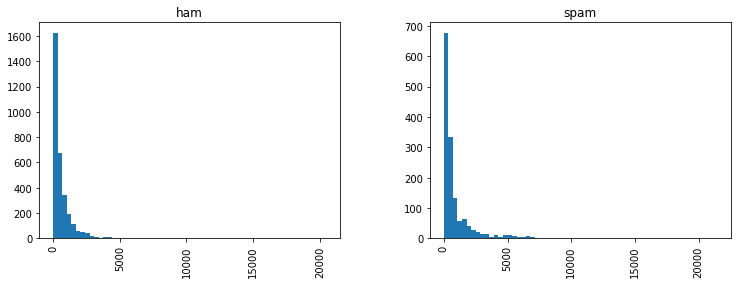

In [41]:
#plotting the histogram for the ham and spam depending on the length 
email.hist(column='length',by='target',bins=60,figsize=(12,4));
plt.emaillim(-40,950);

In [42]:
#Assigning the target ham to data_ham and spam to data_spam
data_ham  = email[email['target'] == "ham"].copy()
data_spam = email[email['target'] == "spam"].copy()

In [43]:
#writing function for the wordcloud for the ham and spam
def show_wordcloud(data_spam_or_ham, title):
    text = ' '.join(data_spam_or_ham['emails'].astype(str).tolist())
    stopwords = set(wordcloud.STOPWORDS)
    
    fig_wordcloud = wordcloud.WordCloud(stopwords=stopwords,background_color='lightgrey',
                    colormap='viridis', width=800, height=600).generate(text)
    
    plt.figure(figsize=(10,7), frameon=True)
    plt.imshow(fig_wordcloud)  
    plt.axis('off')
    plt.title(title, fontsize=20 )
    plt.show()

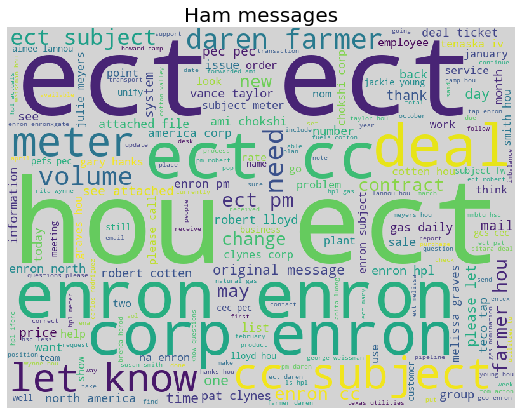

In [44]:
#wordcloud for ham
show_wordcloud(data_ham, "Ham messages")

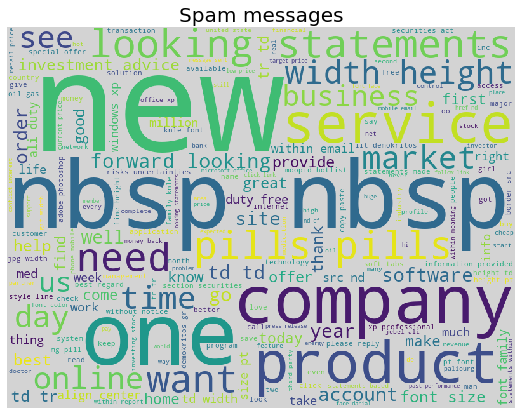

In [45]:
#wordcloid for spam
show_wordcloud(data_spam, "Spam messages")

# Pre_Processing

In [46]:
#Processing the text all the puntuation,stopwords will be removed
def process_text(text):
    
    #What will be covered:
    #1. Remove punctuation
    #2. Remove stopwords
    #3. Return list of clean text words
    
    
    #1
    nopunc = [char for char in text if char not in string.punctuation]
    nopunc = ''.join(nopunc)
    
    #2
    clean_words = [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]
    
    #3
    return clean_words

In [47]:
#applying the process_text for the email
email['emails'].head().apply(process_text)

0                    [christmas, tree, farm, pictures]
1    [vastar, resources, inc, gary, production, hig...
2    [calpine, daily, gas, nomination, calpine, dai...
3    [issue, fyi, see, note, already, done, stella,...
4    [meter, nov, allocation, fyi, forwarded, lauri...
Name: emails, dtype: object

### splitting the data

In [48]:
#splitting the data in the ratio 70% for the train and 30% for the test
X_train, X_test, y_train, y_test = train_test_split(
    email['emails'], email['target'], test_size=0.3,random_state=158)

In [49]:
#displaying the first five lines of X_train
X_train.head()

542     unify close schedule following tentative close...
2445    deal daren deal number expired end november ne...
1456    final cp name change merger report clarify feb...
1137    wow cash get last email get approved thru top ...
305     logistics enom team hal per discussion logisti...
Name: emails, dtype: object

In [50]:
#displaying the first five lines of y_train
y_train.head()

542      ham
2445     ham
1456     ham
1137    spam
305      ham
Name: target, dtype: object

In [51]:
#concatinating the X_train and y_train by using padas and storing that in Train_data
Train_data=pd.concat([X_train,y_train],axis=1,join_axes=[X_train.index])

C:\Users\DELL\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  


In [52]:
#converting the Train_data to CSV file
Train_data.to_csv("train.csv",encoding='utf_8',index=False)

In [53]:
#Reading the train.csv file and storing it in train
train=pd.read_csv("train.csv")

In [54]:
#Displaying the number of rows and columns
train.shape

(3241, 2)

In [55]:
#statistics of train
train.describe()

,emails,target
count,3240,3241
unique,3240,2
top,august iferc sds noms attached august nominati...,ham
freq,1,2228


In [56]:
#statistics of train by column target
train.groupby('target').describe()

emails                                                               
        count unique                                                top freq
target                                                                      
ham      2228   2228  revised avails forwarded ami chokshi corp enro...    1
spam     1012   1012  smallcap cribsheet investor alert immediate re...    1

In [57]:
#concatinating the X_test and y_test by using padas and storing that in Test_data

Test_data=pd.concat([X_test,y_test],axis=1,join_axes=[X_test.index])

C:\Users\DELL\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: The join_axes-keyword is deprecated. Use .reindex or .reindex_like on the result to achieve the same functionality.
  This is separate from the ipykernel package so we can avoid doing imports until


In [58]:
#converting the Test_data to CSV file
Test_data.to_csv("test.csv",encoding='utf_8',index=False)

In [59]:
#Reading the test.csv file and storing it in test
test=pd.read_csv("test.csv")

In [60]:
#Displaying the number of rows and columns

test.shape

(1390, 2)

In [61]:
#statistics of test

test.describe()

,emails,target
count,1390,1390
unique,1390,2
top,wow bed hello adam password downloading movies...,ham
freq,1,946


In [62]:
#statistics of test by column test

test.groupby('target').describe()

emails                                                               
        count unique                                                top freq
target                                                                      
ham       946    946  fyi gas flow forwarded jackie young hou ect al...    1
spam      444    444  settle less rolex r rolex replicas replica wat...    1

### performing some EDA on training dataset 

In [63]:
#counting the number of ham and spam in the train 
train.target.value_counts()



ham     2228
spam    1013
Name: target, dtype: int64

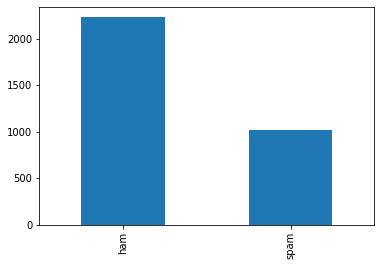

In [64]:
#plotting the barplot for the column target of train by using matplotlib
train.target.value_counts().plot.bar()

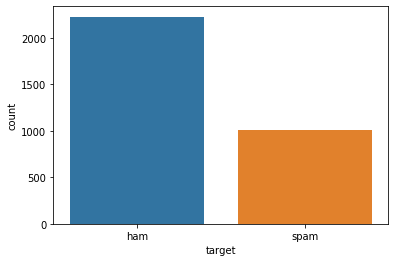

In [65]:
#plotting the barplot by using seaborn
sns.countplot('target', data = train)

In [66]:
#Assigning the target ham to data_ham and spam to data_spam for train data
data_ham  = train[train['target'] == "ham"].copy()
data_spam = train[train['target'] == "spam"].copy()

In [67]:
##writing function for the wordcloud for the ham and spam
def show_wordcloud(data_spam_or_ham, title):
    text = ' '.join(data_spam_or_ham['emails'].astype(str).tolist())
    stopwords = set(wordcloud.STOPWORDS)
    
    fig_wordcloud = wordcloud.WordCloud(stopwords=stopwords,background_color='lightgrey',
                    colormap='viridis', width=800, height=600).generate(text)
    
    plt.figure(figsize=(10,7), frameon=True)
    plt.imshow(fig_wordcloud)  
    plt.axis('off')
    plt.title(title, fontsize=20 )
    plt.show()

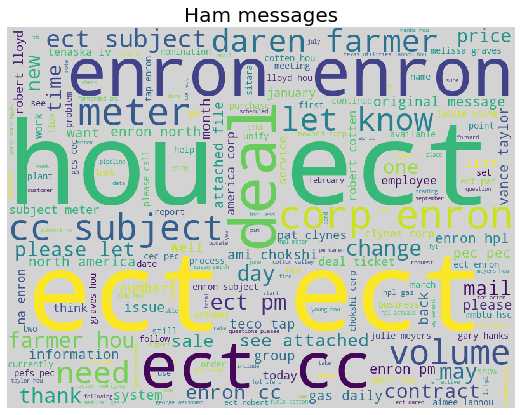

In [68]:
#wordcloud for ham
show_wordcloud(data_ham, "Ham messages")

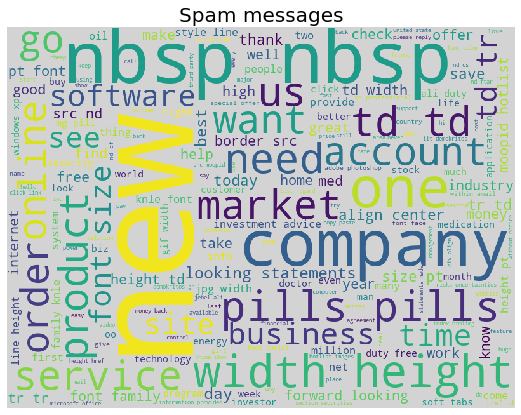

In [69]:
#wordcloud for spam
show_wordcloud(data_spam, "Spam messages")

In [70]:
#cleaning the data by removing hyperlinks,good and bad words and appostophes and puntuations
def clean_data(sentence):
    
    ## removing web links
    s =  re.sub(r'http\S+', '',str(sentence)) 
    ## removing words like gooood and poooor to good and poor
    s = ''.join(''.join(s)[:2] for _, s in itertools.groupby(s))
    ## removing appostophes
    s = remove_appostophes(s)
    ## removing punctuations from the code 
    s = remove_punctuations(s)
    return s

In [71]:
#function to remove puntuations
def remove_punctuations(my_str):
    punctuations = '''!()-[]{};:'"\,./?@#$%^&@*_~'''
    no_punct = ""
    for char in my_str:
        if char not in punctuations:
            no_punct = no_punct + char
    return no_punct

In [72]:
#functions to remove appostophes
def remove_appostophes(sentence):
    APPOSTOPHES = {"s" : "is", "re" : "are", "t": "not", "ll":"will","d":"had","ve":"have","m": "am"}
    words = nltk.tokenize.word_tokenize(sentence)
    final_words=[]
    for word in words:
        broken_words=word.split("'")
        for single_words in broken_words:
            final_words.append(single_words)
    reformed = [APPOSTOPHES[word] if word in APPOSTOPHES else word for word in final_words]
    reformed = " ".join(reformed)
    return reformed

In [73]:
#cleaning the train data 
train['emails']=train['emails'].apply(clean_data)


In [74]:
#tokenising the data
stop_words = set(stopwords.words("english"))
def my_tokeniser(s):
    s = clean_data(s)
    s = s.lower()
    tokens = nltk.tokenize.word_tokenize(s)
    tokens = [t for t in tokens if len(t)>2]
    lemmatizer = WordNetLemmatizer()
    tokens = [lemmatizer.lemmatize(t) for t in tokens]
    tokens = [t for t in tokens if t not in stop_words]
    return tokens

In [75]:
#tokenising the train data
train['emails']=train['emails'].apply(my_tokeniser)


In [76]:
#printing the train dataframe
train

,emails,target
0,"[unify, close, schedule, following, tentative,...",ham
1,"[deal, daren, deal, number, expired, end, nove...",ham
2,"[final, name, change, merger, report, clarify,...",ham
3,"[wow, cash, get, last, email, get, approved, t...",spam
4,"[logistics, enom, team, hal, per, discussion, ...",ham
...,...,...
3236,"[cia, li, available, next, customer, med, avai...",spam
3237,"[call, note, april, friday, april, notified, g...",ham
3238,"[galleryfurniture, com, bowl, enron, proud, ma...",ham
3239,"[november, availability, first, devon, number,...",ham


In [77]:
#assigning ham data to df_ham
df_ham=train[train['target']=="ham"]
df_ham

,emails,target
0,"[unify, close, schedule, following, tentative,...",ham
1,"[deal, daren, deal, number, expired, end, nove...",ham
2,"[final, name, change, merger, report, clarify,...",ham
4,"[logistics, enom, team, hal, per, discussion, ...",ham
5,"[monthly, manangement, lunch, please, clear, c...",ham
...,...,...
3235,"[txu, fuel, sd, nomination, december, attached...",ham
3237,"[call, note, april, friday, april, notified, g...",ham
3238,"[galleryfurniture, com, bowl, enron, proud, ma...",ham
3239,"[november, availability, first, devon, number,...",ham


In [78]:
#finding the length of text of ham
df_ham['Length'] = df_ham['emails'].str.len()
df_ham.head()

C:\Users\DELL\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,emails,target,Length
0,"[unify, close, schedule, following, tentative,...",ham,43
1,"[deal, daren, deal, number, expired, end, nove...",ham,17
2,"[final, name, change, merger, report, clarify,...",ham,31
4,"[logistics, enom, team, hal, per, discussion, ...",ham,98
5,"[monthly, manangement, lunch, please, clear, c...",ham,24


In [79]:
#assigning the spam data of train to df_spam
df_spam=train[train['target']=="spam"]
df_spam

,emails,target
3,"[wow, cash, get, last, email, get, approved, t...",spam
6,"[local, wife, area, click, removed]",spam
10,"[kenneth, kenneth, okoh, ecobank, benin, rue, ...",spam
11,"[made, money, porn, make, day, adult, industry...",spam
14,"[free, sporting, event, paying, movie, border,...",spam
...,...,...
3227,"[know, need, goodbye, dramaturgy, concavekraka...",spam
3228,"[uiccib, new, generic, viarga, special, paliou...",spam
3230,"[software, breakfast, store, fountainhead, lea...",spam
3231,"[buy, cheap, viagra, new, offer, buy, cheap, a...",spam


In [80]:
#finding the length of text of spam
df_spam['Length'] = df_spam['emails'].str.len()
df_spam.head()

C:\Users\DELL\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,emails,target,Length
3,"[wow, cash, get, last, email, get, approved, t...",spam,61
6,"[local, wife, area, click, removed]",spam,5
10,"[kenneth, kenneth, okoh, ecobank, benin, rue, ...",spam,227
11,"[made, money, porn, make, day, adult, industry...",spam,34
14,"[free, sporting, event, paying, movie, border,...",spam,148


## Finding top 20 words

In [81]:
#coverting the emails of ham to a list
one_list=df_ham['emails'].tolist()
one_list

[['unify',
  'close',
  'schedule',
  'following',
  'tentative',
  'close',
  'schedule',
  'coming',
  'month',
  'please',
  'keep',
  'mind',
  'following',
  'key',
  'time',
  'unify',
  'sitara',
  'bridge',
  'back',
  'friday',
  'march',
  'error',
  'must',
  'clear',
  'time',
  'mass',
  'draft',
  'friday',
  'evening',
  'accrual',
  'process',
  'begin',
  'monday',
  'april',
  'change',
  'timeline',
  'please',
  'ensure',
  'contacted',
  'soon',
  'possible',
  'thank',
  'melissa'],
 ['deal',
  'daren',
  'deal',
  'number',
  'expired',
  'end',
  'november',
  'need',
  'either',
  'extended',
  'december',
  'new',
  'deal',
  'inputted',
  'assist',
  'thanks',
  'mike'],
 ['final',
  'name',
  'change',
  'merger',
  'report',
  'clarify',
  'february',
  'report',
  'error',
  'sent',
  'report',
  'everyone',
  'please',
  'notice',
  'bottom',
  'report',
  'worksheet',
  'tab',
  'august',
  'current',
  'information',
  'located',
  'apologize',
  'confu

In [82]:
#merging them together and placing in one list
merged = list(itertools.chain.from_iterable(one_list))
merged

['unify',
 'close',
 'schedule',
 'following',
 'tentative',
 'close',
 'schedule',
 'coming',
 'month',
 'please',
 'keep',
 'mind',
 'following',
 'key',
 'time',
 'unify',
 'sitara',
 'bridge',
 'back',
 'friday',
 'march',
 'error',
 'must',
 'clear',
 'time',
 'mass',
 'draft',
 'friday',
 'evening',
 'accrual',
 'process',
 'begin',
 'monday',
 'april',
 'change',
 'timeline',
 'please',
 'ensure',
 'contacted',
 'soon',
 'possible',
 'thank',
 'melissa',
 'deal',
 'daren',
 'deal',
 'number',
 'expired',
 'end',
 'november',
 'need',
 'either',
 'extended',
 'december',
 'new',
 'deal',
 'inputted',
 'assist',
 'thanks',
 'mike',
 'final',
 'name',
 'change',
 'merger',
 'report',
 'clarify',
 'february',
 'report',
 'error',
 'sent',
 'report',
 'everyone',
 'please',
 'notice',
 'bottom',
 'report',
 'worksheet',
 'tab',
 'august',
 'current',
 'information',
 'located',
 'apologize',
 'confusion',
 'also',
 'erms',
 'shortname',
 'change',
 'made',
 'afternoon',
 'cheryl',
 '

In [83]:
#counting the each word count
cntr=Counter(merged)
cntr

Counter({'unify': 191,
         'close': 72,
         'schedule': 90,
         'following': 392,
         'tentative': 2,
         'coming': 67,
         'month': 600,
         'please': 1789,
         'keep': 119,
         'mind': 26,
         'key': 39,
         'time': 468,
         'sitara': 581,
         'bridge': 58,
         'back': 304,
         'friday': 205,
         'march': 305,
         'error': 103,
         'must': 94,
         'clear': 74,
         'mass': 9,
         'draft': 35,
         'evening': 27,
         'accrual': 10,
         'process': 156,
         'begin': 61,
         'monday': 144,
         'april': 296,
         'change': 733,
         'timeline': 11,
         'ensure': 47,
         'contacted': 8,
         'soon': 103,
         'possible': 100,
         'thank': 205,
         'melissa': 277,
         'deal': 2328,
         'daren': 1187,
         'number': 360,
         'expired': 41,
         'end': 146,
         'november': 172,
         'need': 998,

In [84]:
#Assigning the wording according to count in descending order
a = sorted(cntr.items(), key=lambda x: x[1],reverse=True)    
print(a)

[('ect', 9857), ('hou', 5149), ('enron', 4410), ('deal', 2328), ('meter', 1895), ('please', 1789), ('gas', 1766), ('subject', 1758), ('hpl', 1364), ('com', 1235), ('corp', 1191), ('daren', 1187), ('thanks', 1164), ('volume', 1164), ('need', 998), ('know', 914), ('mmbtu', 884), ('forwarded', 879), ('day', 877), ('change', 733), ('let', 715), ('farmer', 701), ('contract', 699), ('new', 673), ('may', 641), ('month', 600), ('robert', 592), ('attached', 584), ('sitara', 581), ('ticket', 570), ('question', 562), ('would', 554), ('pec', 518), ('sale', 517), ('see', 512), ('texas', 496), ('get', 495), ('price', 495), ('mail', 493), ('ena', 488), ('nomination', 471), ('time', 468), ('energy', 446), ('information', 444), ('call', 435), ('nom', 434), ('bob', 427), ('flow', 423), ('production', 422), ('xl', 417), ('gary', 403), ('message', 400), ('following', 392), ('mary', 389), ('sent', 375), ('one', 371), ('service', 361), ('number', 360), ('also', 353), ('file', 342), ('purchase', 332), ('dail

In [85]:
#Now taking the top 20 words of ham and storing it in word_ham
word_ham=cntr.most_common(20)
word_ham

[('ect', 9857),
 ('hou', 5149),
 ('enron', 4410),
 ('deal', 2328),
 ('meter', 1895),
 ('please', 1789),
 ('gas', 1766),
 ('subject', 1758),
 ('hpl', 1364),
 ('com', 1235),
 ('corp', 1191),
 ('daren', 1187),
 ('thanks', 1164),
 ('volume', 1164),
 ('need', 998),
 ('know', 914),
 ('mmbtu', 884),
 ('forwarded', 879),
 ('day', 877),
 ('change', 733)]

In [86]:
#coverting the emails of spam to a list
one_list_spam=df_spam['emails'].tolist()
one_list_spam

[['wow',
  'cash',
  'get',
  'last',
  'email',
  'get',
  'approved',
  'thru',
  'top',
  'lender',
  'saving',
  'alot',
  'extra',
  'cash',
  'every',
  'month',
  'house',
  'payment',
  'poor',
  'creddit',
  'problem',
  'refinance',
  'buy',
  'new',
  'home',
  'even',
  'cash',
  'lender',
  'provide',
  'exceptional',
  'rate',
  'make',
  'happy',
  'many',
  'year',
  'road',
  'visit',
  'link',
  'within',
  'hour',
  'confirm',
  'exceptional',
  'deal',
  'family',
  'http',
  'jame',
  'dlfj',
  'best',
  'wish',
  'loyd',
  'cummings',
  'bank',
  'america',
  'main',
  'street',
  'richmond',
  'alfa',
  'laval',
  'isando',
  'south',
  'africa'],
 ['local', 'wife', 'area', 'click', 'removed'],
 ['kenneth',
  'kenneth',
  'okoh',
  'ecobank',
  'benin',
  'rue',
  'gouverneur',
  'bayol',
  'cotonou',
  'tilex',
  'ecobnk',
  'ctnou',
  'phone',
  'atten',
  'transfer',
  'usd',
  'million',
  'want',
  'transfer',
  'overseas',
  'usd',
  'twenty',
  'six',
  'm

In [87]:
#merging them together and placing in one list
merged = list(itertools.chain.from_iterable(one_list_spam))
merged

['wow',
 'cash',
 'get',
 'last',
 'email',
 'get',
 'approved',
 'thru',
 'top',
 'lender',
 'saving',
 'alot',
 'extra',
 'cash',
 'every',
 'month',
 'house',
 'payment',
 'poor',
 'creddit',
 'problem',
 'refinance',
 'buy',
 'new',
 'home',
 'even',
 'cash',
 'lender',
 'provide',
 'exceptional',
 'rate',
 'make',
 'happy',
 'many',
 'year',
 'road',
 'visit',
 'link',
 'within',
 'hour',
 'confirm',
 'exceptional',
 'deal',
 'family',
 'http',
 'jame',
 'dlfj',
 'best',
 'wish',
 'loyd',
 'cummings',
 'bank',
 'america',
 'main',
 'street',
 'richmond',
 'alfa',
 'laval',
 'isando',
 'south',
 'africa',
 'local',
 'wife',
 'area',
 'click',
 'removed',
 'kenneth',
 'kenneth',
 'okoh',
 'ecobank',
 'benin',
 'rue',
 'gouverneur',
 'bayol',
 'cotonou',
 'tilex',
 'ecobnk',
 'ctnou',
 'phone',
 'atten',
 'transfer',
 'usd',
 'million',
 'want',
 'transfer',
 'overseas',
 'usd',
 'twenty',
 'six',
 'million',
 'united',
 'state',
 'dollar',
 'ecobank',
 'benin',
 'courage',
 'ask',
 

In [88]:
#counting the each word count
cntr=Counter(merged)
cntr

Counter({'wow': 5,
         'cash': 56,
         'get': 354,
         'last': 89,
         'email': 363,
         'approved': 49,
         'thru': 3,
         'top': 91,
         'lender': 11,
         'saving': 35,
         'alot': 1,
         'extra': 22,
         'every': 77,
         'month': 102,
         'house': 27,
         'payment': 39,
         'poor': 8,
         'creddit': 1,
         'problem': 46,
         'refinance': 9,
         'buy': 86,
         'new': 314,
         'home': 100,
         'even': 87,
         'provide': 43,
         'exceptional': 4,
         'rate': 109,
         'make': 139,
         'happy': 31,
         'many': 128,
         'year': 125,
         'road': 15,
         'visit': 111,
         'link': 150,
         'within': 194,
         'hour': 102,
         'confirm': 25,
         'deal': 71,
         'family': 115,
         'http': 767,
         'jame': 1,
         'dlfj': 1,
         'best': 184,
         'wish': 60,
         'loyd': 1,
        

In [89]:
#taking the top 20 words in spam
word_spam=cntr.most_common(20)
word_spam

[('http', 767),
 ('com', 722),
 ('company', 547),
 ('font', 480),
 ('price', 446),
 ('nbsp', 408),
 ('email', 363),
 ('height', 359),
 ('get', 354),
 ('please', 327),
 ('new', 314),
 ('information', 309),
 ('statement', 301),
 ('pill', 299),
 ('stock', 296),
 ('width', 292),
 ('time', 283),
 ('size', 278),
 ('one', 273),
 ('may', 267)]

{'whiskers': [<matplotlib.lines.Line2D at 0x204c879c5f8>,
 'caps': [<matplotlib.lines.Line2D at 0x204c879cc88>,
 'boxes': [<matplotlib.lines.Line2D at 0x204c879c208>],
 'medians': [<matplotlib.lines.Line2D at 0x204c879cf60>],
 'fliers': [<matplotlib.lines.Line2D at 0x204c87a44e0>],
 'means': []}

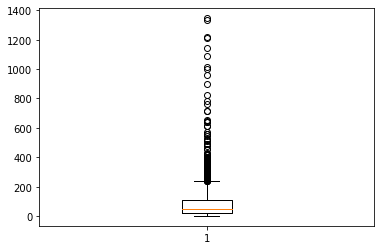

In [90]:
#plotting boxplot for the length of ham words
plt.boxplot(df_ham['Length'])

{'whiskers': [<matplotlib.lines.Line2D at 0x204c867a668>,
 'caps': [<matplotlib.lines.Line2D at 0x204c867ad68>,
 'boxes': [<matplotlib.lines.Line2D at 0x204c867a240>],
 'medians': [<matplotlib.lines.Line2D at 0x204c8685438>],
 'fliers': [<matplotlib.lines.Line2D at 0x204c8685780>],
 'means': []}

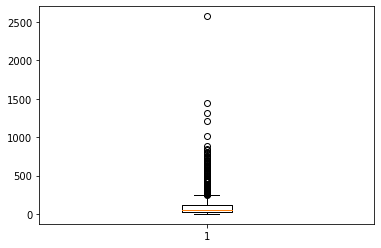

In [91]:
#plotting boxplot for the length of spam words
plt.boxplot(df_spam['Length'])

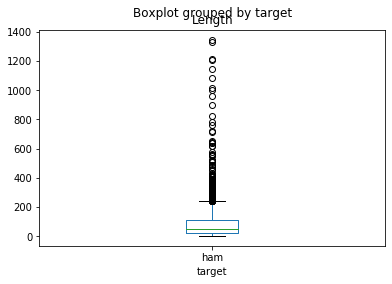

In [92]:
#plotting the boxplot for ham by using target column
df_ham.boxplot(by='target', 
                       column=['Length'], 
                       grid=False)

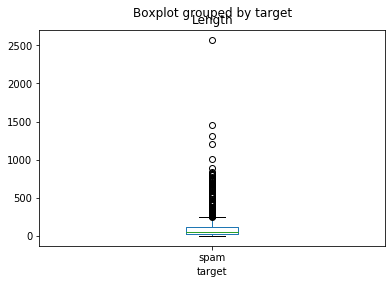

In [93]:
#plotting the boxplot for spam by using target column

df_spam.boxplot(by='target', 
                       column=['Length'], 
                       grid=False)

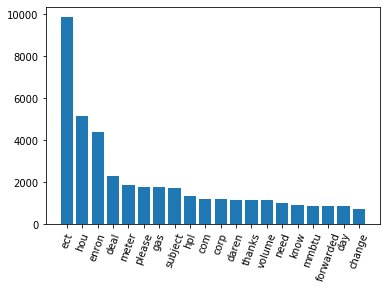

In [94]:

#plotting the top 20 words of the ham
plt.bar(range(len(word_ham)), [val[1] for val in word_ham], align='center')
plt.xticks(range(len(word_ham)), [val[0] for val in word_ham])
plt.xticks(rotation=70)
plt.show()

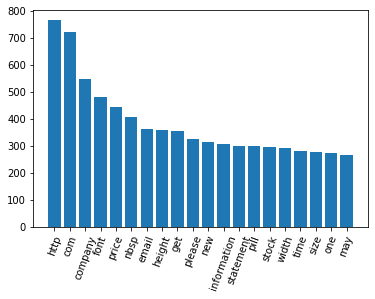

In [95]:
#plotting the top 20 words of the spam

plt.bar(range(len(word_spam)), [val[1] for val in word_spam], align='center')
plt.xticks(range(len(word_spam)), [val[0] for val in word_spam])
plt.xticks(rotation=70)
plt.show()

## Supervised classification

In [96]:
### Performing Feature Extraction by using count Vectorizer and TfidfTransformer

In [97]:
# Convert a collection of text documents to a matrix of token counts
from sklearn.feature_extraction.text import CountVectorizer
#Convert string to integer counts, learn the vocabulary dictionary and return term-document matrix
messages_bow = CountVectorizer(analyzer=process_text).fit_transform(email['emails'])

In [98]:
# Transform a count matrix to a normalized tf or tf-idf representation
# Tf means term-frequency while tf-idf means term-frequency times inverse document-frequency. 
from sklearn.feature_extraction.text import TfidfTransformer
#Learn the idf vector to fit to data, then transform it.
messages_tfidf = TfidfTransformer().fit_transform(messages_bow)

In [99]:
#Split the data into 70% training (X_train & y_train) and 30% testing (X_test & y_test) data sets
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(messages_tfidf, email['target'], test_size = 0.30, random_state = 0)

In [146]:
messages_bow.shape

(4631, 45631)

In [147]:
messages_tfidf.shape

(4631, 45631)

### Building models

#### Navie Bayes classifier

In [100]:
#Create and train the Naive Bayes classifier
#The multinomial Naive Bayes classifier is suitable for classification with discrete features (e.g., word counts for text classification)
from sklearn.naive_bayes import MultinomialNB
classifier = MultinomialNB()
classifier.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [101]:
#Print the predictions
print(classifier.predict(X_train))

#Print the actual values
print(y_train.values)

['spam' 'ham' 'spam' ... 'ham' 'ham' 'ham']
['spam' 'ham' 'spam' ... 'ham' 'ham' 'ham']


In [102]:
#Evaluate the model on the training data set
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
pred = classifier.predict(X_train)
print(classification_report(y_train ,pred ))
print('Confusion Matrix: \n',confusion_matrix(y_train,pred))
print()
print('Accuracy: ', accuracy_score(y_train,pred))

              precision    recall  f1-score   support

         ham       0.96      1.00      0.98      2188
        spam       1.00      0.92      0.96      1053

    accuracy                           0.97      3241
   macro avg       0.98      0.96      0.97      3241
weighted avg       0.97      0.97      0.97      3241

Confusion Matrix: 
 [[2188    0]
 [  88  965]]

Accuracy:  0.9728478864547979


In [103]:
#Print the predictions
print('Predicted value: ',classifier.predict(X_test))

#Print Actual Label
print('Actual value: ',y_test.values)

Predicted value:  ['ham' 'ham' 'ham' ... 'ham' 'ham' 'spam']
Actual value:  ['ham' 'ham' 'ham' ... 'ham' 'ham' 'spam']


In [104]:
#Evaluate the model on the test data set
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
pred = classifier.predict(X_test)
print(classification_report(y_test ,pred ))

print('Confusion Matrix: \n', confusion_matrix(y_test,pred))
print()
print('Accuracy: ', accuracy_score(y_test,pred))

              precision    recall  f1-score   support

         ham       0.90      1.00      0.94       986
        spam       0.99      0.72      0.84       404

    accuracy                           0.92      1390
   macro avg       0.95      0.86      0.89      1390
weighted avg       0.92      0.92      0.91      1390

Confusion Matrix: 
 [[984   2]
 [113 291]]

Accuracy:  0.9172661870503597


In [105]:
import pickle
# writing the objects to file
pickle.dump(messages_tfidf, open("messages_tfidf.sav", "wb"))
pickle.dump(classifier, open("Naivemodel.sav", "wb"))
#a=pickle.load(open('Naivemodel.sav', 'rb'))

#### Logistic Regression

In [106]:
#building the LOgistic Regression model
from sklearn.linear_model import LogisticRegression
model = LogisticRegression()
model.fit(X_train,y_train)

C:\Users\DELL\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

In [107]:
# Making predictions

prediction = dict()

prediction["Logistic"] = model.predict(X_test)

In [108]:
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report

In [109]:
#Accuracy of the model
accuracy_score(y_test,prediction["Logistic"])

0.9884892086330935

In [110]:
#printing report and accuracy
print(classification_report(y_test,prediction["Logistic"]))
print('Accuracy: ', accuracy_score(y_test,prediction["Logistic"]))

              precision    recall  f1-score   support

         ham       1.00      0.99      0.99       986
        spam       0.97      1.00      0.98       404

    accuracy                           0.99      1390
   macro avg       0.98      0.99      0.99      1390
weighted avg       0.99      0.99      0.99      1390

Accuracy:  0.9884892086330935


In [111]:
#saving the model
pickle.dump(model, open("Logisticmodel.sav", "wb"))

#### KNeighborsClassifier

In [112]:
# check classification accuracy of KNN with K=5
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)
metrics.accuracy_score(y_test, y_pred)

0.9647482014388489

In [113]:
#saving the model by using pickle
pickle.dump(knn, open("knnmodel.sav", "wb"))
#a=pickle.load(open('knnmodel.sav', 'rb'))

In [114]:
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split

In [115]:
# 10-fold cross-validation with K=5 for KNN (the n_neighbors parameter)
# k = 5 for KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=5)

# Using cross_val_score function
# cv=10 for 10 folds
# scoring='accuracy' for evaluation metric - althought they are many
scores = cross_val_score(knn, messages_tfidf, email['target'], cv=10, scoring='accuracy')
print(scores)

[0.96336207 0.98060345 0.9762931  0.96982759 0.9762419  0.95680346
 0.96544276 0.96320346 0.96753247 0.92857143]


In [116]:
# use average accuracy as an estimate of out-of-sample accuracy
# numpy array has a method mean()
print(scores.mean())

0.9647881687154236


In [117]:
# search for an optimal value of K for KNN

# range of k we want to try
k_range = range(1, 31)
# empty list to store scores
k_scores = []

# 1. we will loop through reasonable values of k
for k in k_range:
    # 2. run KNeighborsClassifier with k neighbours
    knn = KNeighborsClassifier(n_neighbors=k)
    # 3. obtain cross_val_score for KNeighborsClassifier with k neighbours
    scores = cross_val_score(knn, messages_tfidf, email['target'], cv=10, scoring='accuracy')
    # 4. append mean of scores for k neighbors to k_scores list
    k_scores.append(scores.mean())


print(k_scores)

[0.6619164109952261, 0.9507576382245893, 0.9624160826202421, 0.9559347088327872, 0.9647881687154236, 0.9565905903076344, 0.9632865443312676, 0.956592458272841, 0.9639372914206273, 0.9565943222079178, 0.9628564448386449, 0.954862722491381, 0.9609111938308705, 0.9557303893073239, 0.9604815618333158, 0.9544382268943787, 0.9578911615866075, 0.9522760622052161, 0.9546546811409587, 0.9503326771475837, 0.9546542136458909, 0.9505481943889631, 0.9548673994571255, 0.9509796963667896, 0.9550805872834248, 0.9509787633917186, 0.954434033544222, 0.9499011791998871, 0.953788414795155, 0.9496875279086497]


In [118]:
# in essence, this is basically running the k-fold cross-validation method 30 times because we want to run through K values from 1 to 30
# we should have 30 scores here
print('Length of list', len(k_scores))
print('Max of list', max(k_scores))

Length of list 30
Max of list 0.9647881687154236


Text(0, 0.5, 'Cross-validated accuracy')

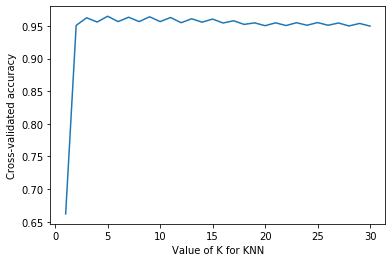

In [119]:


# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
# plt.plot(x_axis, y_axis)
plt.plot(k_range, k_scores)
plt.xlabel('Value of K for KNN')
plt.ylabel('Cross-validated accuracy')

In [120]:

# 10-fold cross-validation with the best KNN model
knn = KNeighborsClassifier(n_neighbors=5)


# calculating the mean directly on the results
print(cross_val_score(knn, messages_tfidf, email['target'], cv=10, scoring='accuracy').mean())

0.9647881687154236


# Model selection 

In [121]:


#building the more number of models to select one best model
lr = LogisticRegression()
nb = MultinomialNB()
knc = KNeighborsClassifier()
svc = SVC(gamma = 'auto')
dtc = DecisionTreeClassifier()
rfc = RandomForestClassifier(n_estimators=100)
gbc = GradientBoostingClassifier()
abc = AdaBoostClassifier()



models = {'Logistic Regression':lr, 'Naive Bayes classifier':nb, 'k-nearest neighbors':knc, 
          'Support Vector Machine':svc, 'Decision Tree Classifier':dtc, 
          'Random Forest Classifier':rfc, 'Gradient Boosting Classifier':gbc, 'AdaBoost Classifier':abc}

In [122]:
#Writing a function to fit the model on training data and make predictions on test data.
def eval_model(model):
    
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    
    test_accuracy = accuracy_score(y_test, y_pred)
    conf_matrix = pd.DataFrame(confusion_matrix(y_test, y_pred), columns=['ham', 'spam'], index=['ham','spam'])
    return test_accuracy, conf_matrix

In [123]:
#test accuracies and confusion matrix for the models
test_accuracies = []
confusion_matrices = []
for name, model in models.items():
    test_acc, conf_matrix = eval_model(model) 
    test_accuracies.append(test_acc)
    confusion_matrices.append(conf_matrix)
    print(f'{name} ---> Test accuracy - {test_acc*100:.2f}%')
    

C:\Users\DELL\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


Logistic Regression ---> Test accuracy - 98.85%
Naive Bayes classifier ---> Test accuracy - 91.73%
k-nearest neighbors ---> Test accuracy - 96.47%
Support Vector Machine ---> Test accuracy - 70.94%
Decision Tree Classifier ---> Test accuracy - 95.11%
Random Forest Classifier ---> Test accuracy - 98.35%
Gradient Boosting Classifier ---> Test accuracy - 96.33%
AdaBoost Classifier ---> Test accuracy - 95.97%


In [124]:
#Building one frame for all test accuracies
results = pd.DataFrame(test_accuracies, index=list(models.keys()), columns=['test_acc'])
results

,test_acc
Logistic Regression,0.988489
Naive Bayes classifier,0.917266
k-nearest neighbors,0.964748
Support Vector Machine,0.709353
Decision Tree Classifier,0.951079
Random Forest Classifier,0.983453
Gradient Boosting Classifier,0.963309
AdaBoost Classifier,0.959712


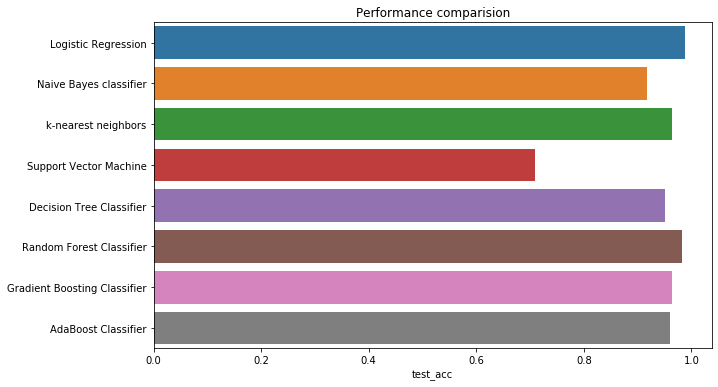

In [125]:
#Barplot for all the model accuracies
plt.figure(figsize=(10, 6))
sns.barplot(x ='test_acc', y=results.index, data=results)
plt.title('Performance comparision')
plt.show()

In [126]:
#plotting confusion matrix for all the models
def plot_confusion_matrices(models, confusion_matrices):
    fig, axs = plt.subplots(2,4, figsize=(10,5)) 

    m = 0
    for i, ax_r in enumerate(axs):
        for j, ax in enumerate(ax_r):
            sns.heatmap(confusion_matrices[m], annot=True, cbar=False, cmap='Blues', fmt='g', ax = ax)
            ax.set_xlabel('Predicted label')
            ax.set_ylabel('True label')
            ax.set_title(f'{list(models.keys())[m]}', fontsize=12, fontweight='bold')
            m += 1

    plt.subplots_adjust(top=0.92, bottom=0.08, left=0.10, right=0.95, hspace=0.25,
                        wspace=0.35)
    plt.tight_layout()
    plt.show()

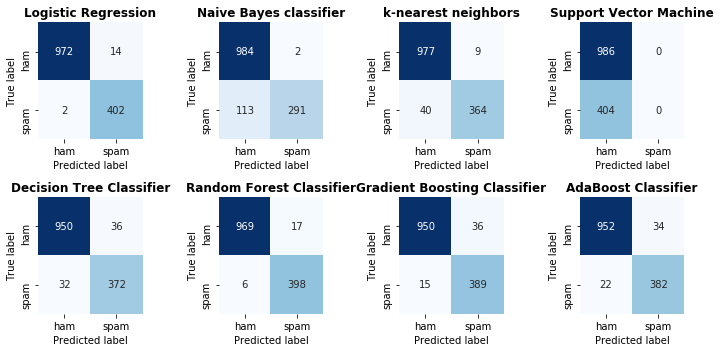

In [127]:
#plotting confusion matrix
plot_confusion_matrices(models, confusion_matrices)

In [128]:
#saving the model
pickle.dump(test_accuracies, open("test_accuracies.sav", "wb"))
pickle.dump(confusion_matrices, open("confusion_matrices.sav", "wb"))

# MODEL EVALUATION

In [129]:
#build a pipeline to fit and predict on raw text data.
#pipeline for LogisticRegression and TfidfTransformer
pipeline = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', LogisticRegression())
])

In [130]:

#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline.predict(X_test)))

Test accuracy -  0.9884892086330935
Confusion matrix - 
       ham  spam
ham   973    13
spam    3   401
Classification Report 
               precision    recall  f1-score   support

         ham       1.00      0.99      0.99       986
        spam       0.97      0.99      0.98       404

    accuracy                           0.99      1390
   macro avg       0.98      0.99      0.99      1390
weighted avg       0.99      0.99      0.99      1390



C:\Users\DELL\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [131]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  MultinomialNB and TfidfTransformer
pipeline1 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', MultinomialNB())
])

In [132]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline1) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline1.predict(X_test)))

Test accuracy -  0.9
Confusion matrix - 
       ham  spam
ham   984     2
spam  137   267
Classification Report 
               precision    recall  f1-score   support

         ham       0.88      1.00      0.93       986
        spam       0.99      0.66      0.79       404

    accuracy                           0.90      1390
   macro avg       0.94      0.83      0.86      1390
weighted avg       0.91      0.90      0.89      1390



In [133]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  KNeighborsClassifier and TfidfTransformer
pipeline2 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', KNeighborsClassifier())
])

In [134]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline2) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model
print('Classification Report \n', classification_report(y_test, pipeline2.predict(X_test)))

Test accuracy -  0.960431654676259
Confusion matrix - 
       ham  spam
ham   977     9
spam   46   358
Classification Report 
               precision    recall  f1-score   support

         ham       0.96      0.99      0.97       986
        spam       0.98      0.89      0.93       404

    accuracy                           0.96      1390
   macro avg       0.97      0.94      0.95      1390
weighted avg       0.96      0.96      0.96      1390



In [135]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  SVC and TfidfTransformer
pipeline3 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', SVC(gamma = 'auto'))
])

In [136]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline3) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline3.predict(X_test)))

Test accuracy -  0.7093525179856115
Confusion matrix - 
       ham  spam
ham   986     0
spam  404     0
Classification Report 
               precision    recall  f1-score   support

         ham       0.71      1.00      0.83       986
        spam       0.00      0.00      0.00       404

    accuracy                           0.71      1390
   macro avg       0.35      0.50      0.41      1390
weighted avg       0.50      0.71      0.59      1390



C:\Users\DELL\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [137]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  DecisionTreeClassifier and TfidfTransformer
pipeline4 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', DecisionTreeClassifier())
])

In [138]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline4) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline4.predict(X_test)))

Test accuracy -  0.958273381294964
Confusion matrix - 
       ham  spam
ham   949    37
spam   21   383
Classification Report 
               precision    recall  f1-score   support

         ham       0.98      0.96      0.97       986
        spam       0.91      0.95      0.93       404

    accuracy                           0.96      1390
   macro avg       0.95      0.96      0.95      1390
weighted avg       0.96      0.96      0.96      1390



In [139]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  RandomForestClassifier and TfidfTransformer
pipeline5 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', RandomForestClassifier(n_estimators=100))
])

In [140]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline5) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline5.predict(X_test)))

Test accuracy -  0.9820143884892086
Confusion matrix - 
       ham  spam
ham   962    24
spam    1   403
Classification Report 
               precision    recall  f1-score   support

         ham       1.00      0.98      0.99       986
        spam       0.94      1.00      0.97       404

    accuracy                           0.98      1390
   macro avg       0.97      0.99      0.98      1390
weighted avg       0.98      0.98      0.98      1390



In [141]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  GradientBoostingClassifier and TfidfTransformer
pipeline6 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', GradientBoostingClassifier())
])#Test acuuracy and confusion matrix for the model


In [142]:
test_acc, conf_matrix = eval_model(pipeline6) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model

print('Classification Report \n', classification_report(y_test, pipeline6.predict(X_test)))

Test accuracy -  0.9618705035971223
Confusion matrix - 
       ham  spam
ham   947    39
spam   14   390
Classification Report 
               precision    recall  f1-score   support

         ham       0.99      0.96      0.97       986
        spam       0.91      0.97      0.94       404

    accuracy                           0.96      1390
   macro avg       0.95      0.96      0.95      1390
weighted avg       0.96      0.96      0.96      1390



In [143]:
#build a pipeline to fit and predict on raw text data.
#pipeline for  AdaBoostClassifier and TfidfTransformer
pipeline7 = Pipeline([
    ('tfidf_vect', TfidfTransformer()),
    ('classifier', AdaBoostClassifier())
])


In [144]:
#Test acuuracy and confusion matrix for the model
test_acc, conf_matrix = eval_model(pipeline7) 

print('Test accuracy - ',test_acc)
print('Confusion matrix - \n', conf_matrix)
#classification report for the model
print('Classification Report \n', classification_report(y_test, pipeline7.predict(X_test)))

Test accuracy -  0.9532374100719424
Confusion matrix - 
       ham  spam
ham   942    44
spam   21   383
Classification Report 
               precision    recall  f1-score   support

         ham       0.98      0.96      0.97       986
        spam       0.90      0.95      0.92       404

    accuracy                           0.95      1390
   macro avg       0.94      0.95      0.94      1390
weighted avg       0.95      0.95      0.95      1390

